In [227]:
import pickle
import numpy as np
from numpy import linalg as LA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import pandas as pd
from sklearn.linear_model import Ridge
from numpy import nan
from sklearn import linear_model
import imageio

# First we will generate the distribution

In [201]:
# generating the x to be distributed according to a Gaussian distribution with mean 0 and variance 1 
x = np.zeros((200,1000))
x_test = np.zeros((5000,1000))

for i in range(x.shape[0]):
    for j in range(x.shape[1]):
        x[i,j] = np.random.normal(0,10,1)

for i in range(x_test.shape[0]):
    for j in range(x_test.shape[1]):
        x_test[i,j] = np.random.normal(0,10,1)
        
# introducing white gaussian noise

noise = np.random.normal(0, 1/25, x.shape[0])

noise_test = np.random.normal(0, 1/25, x_test.shape[0])

# creating oracle of best linear solution where the highest coefficient value is at the first feature and it dominates
# the other values by a lot
# beta = np.linspace(1,x.shape[1],x.shape[1])
beta = np.zeros(x.shape[1])
beta = beta[::-1]
beta[0] = 40000000000000000000000000000000

y = np.matmul(x,beta) + noise

y = y.reshape((y.size,1))

y_test = np.matmul(x_test,beta) + noise_test

y_test = y_test.reshape((y_test.size,1))

# Using l_2 min norm solutions

In [216]:
test_accuracy  = np.zeros(x.shape[1])
first_feature = np.zeros(x.shape[1])

eig = {}

coeff_list_max = list()
coeff_list_min = list()

unif_lists = list()

for j in range(1,x.shape[1] + 1):
    
    # Using a prescient model where I am just picking the first j features
    unif_list = np.linspace(1,j,j)
    unif_list -=1
    unif_list = unif_list.astype(int)
        
    # selecting the data from the features you have chosen
    temp_x = x[:,unif_list]
    
    unif_lists.append(set(unif_list))

    # fitting the model with the randomly selected features
    lm = LinearRegression().fit(temp_x,y)
    
    # getting the coefficient of the lm model
    beta_temp = lm.coef_
    beta_temp = beta_temp.reshape(beta_temp.size,1)
    beta_temp = beta_temp.astype(float)
    
    if(j > x.shape[0]):
        e,v = np.linalg.eig(np.linalg.inv(np.matmul(temp_x,np.transpose(temp_x))))
        eig[j] =  e
    else:
        e.v = np.linalg.eig(np.linalg.inv(np.matmul(np.tranpose(temp_x),temp_x)))
         eig[j] =  e
            
    # formatting the predictor beta so that we can use the original high dimensional x to make the prediction
    beta = np.zeros((x.shape[1],1))
    counter = 0
    for i in range(x.shape[1]):
        if(i in unif_list):
            beta[i] = beta_temp[counter]
            counter+= 1
        else:
            beta[i] = 0
    
    pred = np.matmul(x_test,beta)
    pred = pred.reshape(pred.size,1)
    
    test_accuracy[j-1] = mean_squared_error(pred,y_test)
    first_feature[j-1] = beta[0]

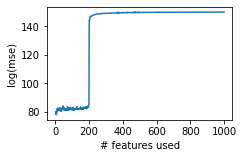

In [238]:
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(3.48,2.3))
plt.ylabel("log(mse)")
plt.xlabel("# features used")
sns.lineplot(x = np.linspace(1,x.shape[1],x.shape[1]), y = (np.log(test_accuracy)))
plt.tight_layout()
plt.savefig('no_double_descent_experimental_prescient_model.pdf', dpi=100, bbox_inches='tight')

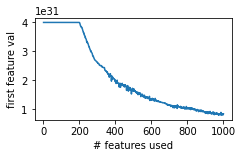

In [210]:
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(3.48,2.3))
plt.ylabel("first feature val")
plt.xlabel("# features used")
sns.lineplot(x = np.linspace(1,x.shape[1],x.shape[1]), y = (first_feature))
plt.tight_layout()
plt.savefig('feature_evol.pdf', dpi=100, bbox_inches='tight')

In [217]:
# Plotting the standard deviation of the eigen values as the number of feature grows

<ipython-input-235-2658115bc773>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(9,7))


KeyError: 800

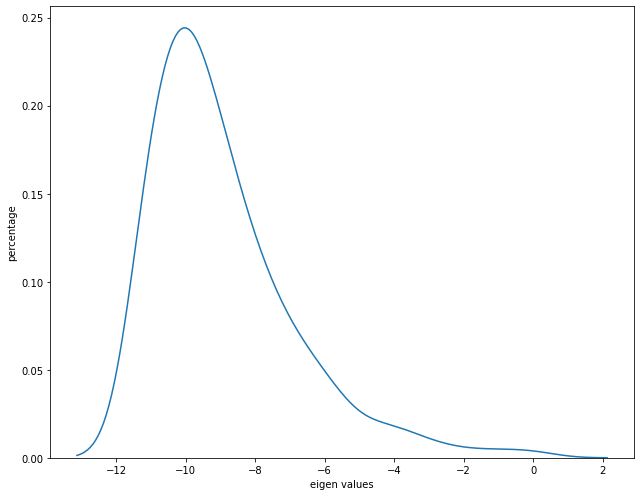

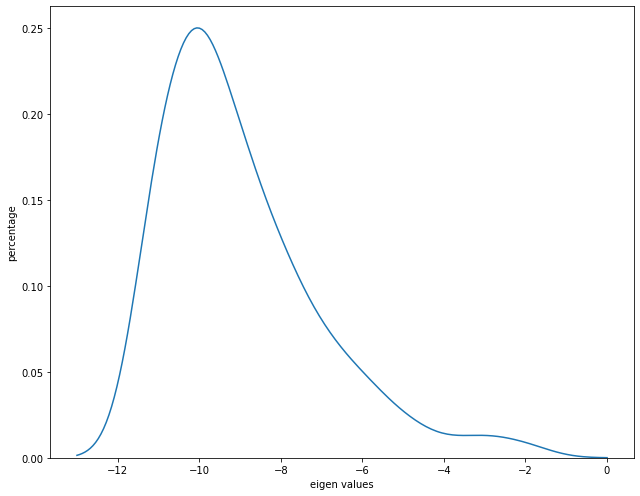

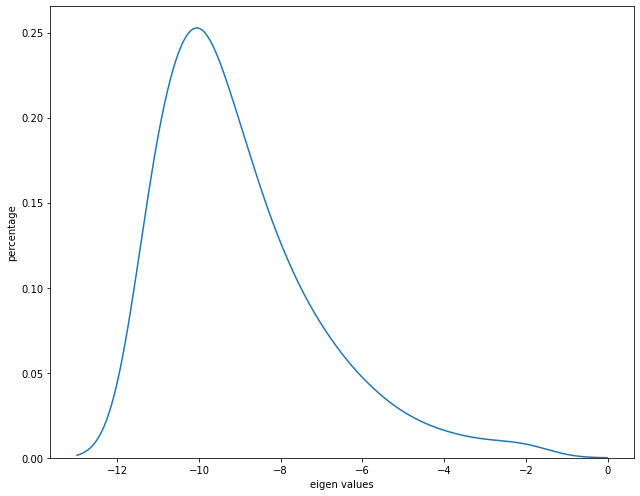

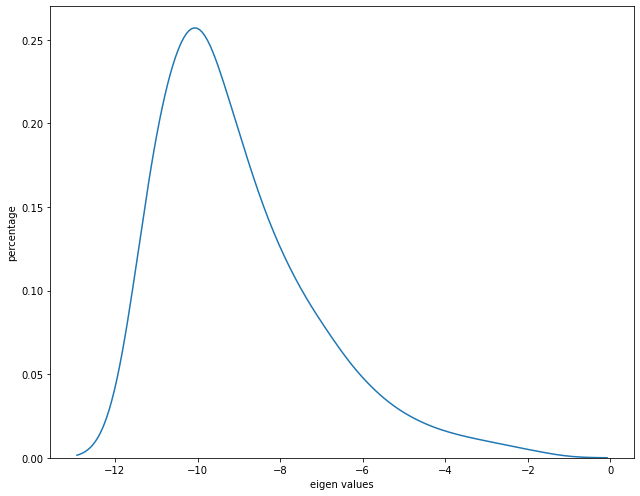

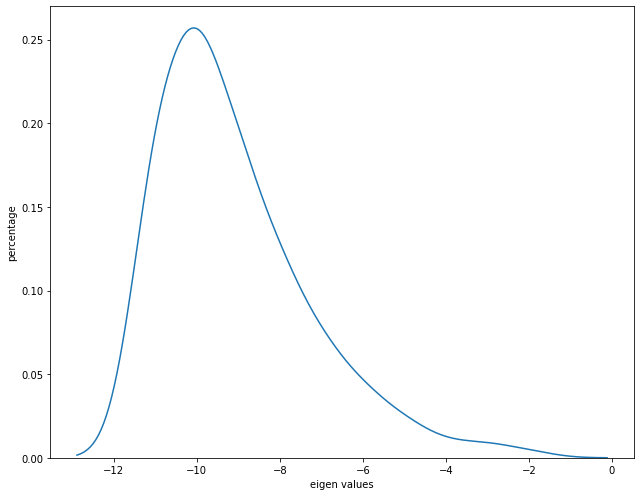

...

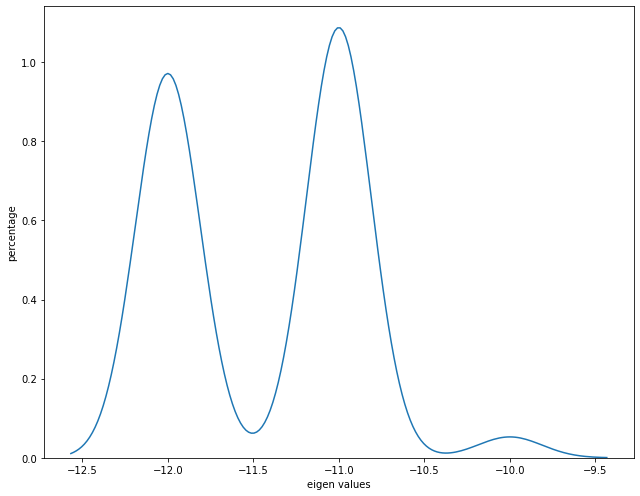

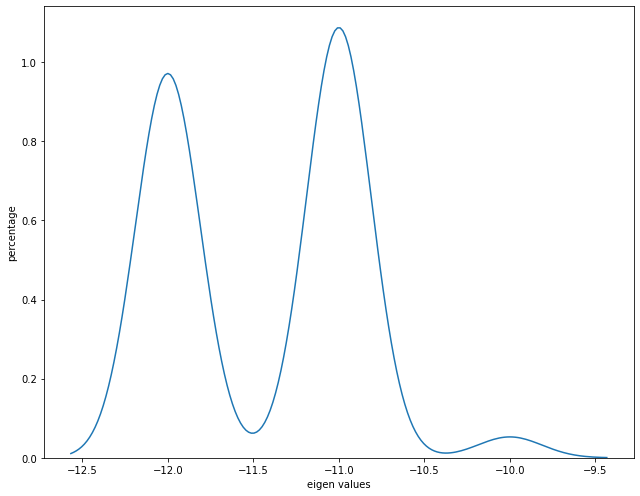

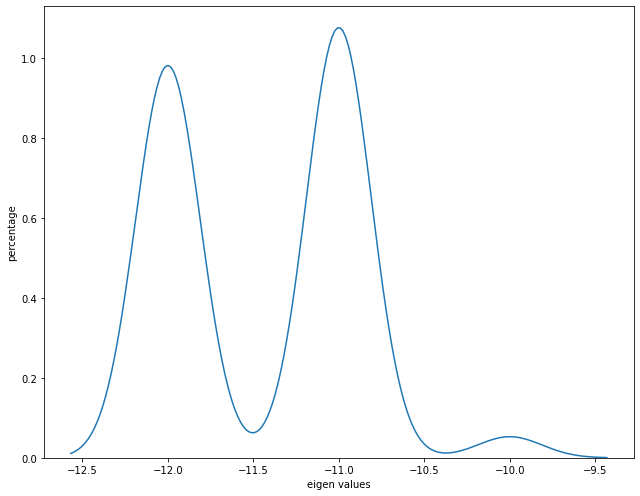

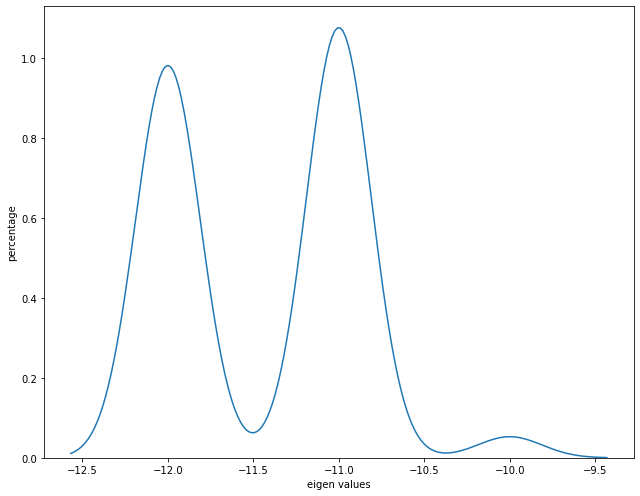

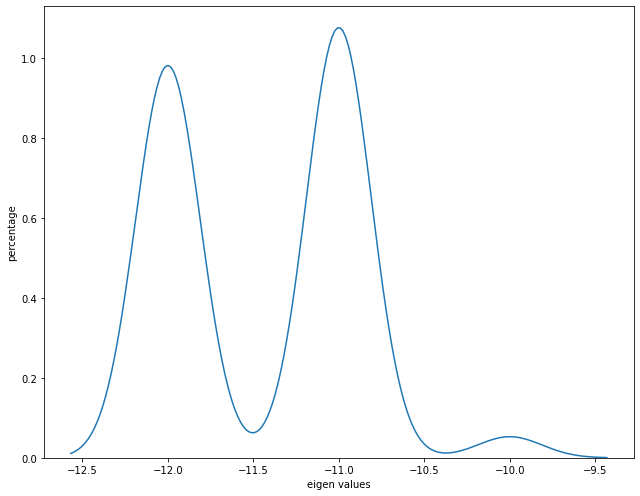

In [235]:
std = np.zeros(x.shape[1])
prefix = 'eigen_dist_pics/eig_'
for i in range(int((x.shape[1]/2))):
    dist_eig = np.round(np.log(eig[2*i]))
    fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(9,7))
    plt.ylabel("percentage")
    plt.xlabel("eigen values")
    sns.kdeplot(x = dist_eig)
    plt.tight_layout()
    plt.ioff()
    plt.savefig((prefix + str(2*i)), dpi=100, bbox_inches='tight')
    

In [236]:
with imageio.get_writer('eigen_dist.gif', mode='I') as writer:
    for i in range(400):
        filename = prefix + str(2*i) + '.png'
        image = imageio.imread(filename)
        writer.append_data(image)